# Daily Challenge : Comprehensive Mobile Price Analysis

Project Tasks
1. Data Loading and Exploration:

  -  Utilize Pandas to load the dataset and explore its initial structure.
  -  Summarize features, target variable, and their respective data types.
  -  Conduct basic descriptive statistics for an overview of the dataset.


2. Data Cleaning and Preprocessing:

    Address missing or null values.
    Transform categorical data into numerical format using suitable methods.


3. Statistical Analysis with NumPy and SciPy:

  -  Execute detailed statistical analysis on each feature, including:
    -    Calculation of central tendency measures (mean, median, mode).
    -    Analysis of variability (range, variance, standard deviation).
    -    Evaluation of distribution shapes through skewness and kurtosis.
  -  Perform hypothesis testing for statistical significance between groups (e.g., different price ranges).
  -  Investigate feature-target correlations using SciPy.
  -  Apply advanced SciPy statistical functions for deeper insights.


4. Data Visualization with Matplotlib:

  -  Produce histograms, scatter plots, and box plots for data distribution and relationship insights.
  -  Employ heatmaps for correlation visualization.
  -  Ensure clarity in plots with appropriate titles, labels, and axis information.


5. Insight Synthesis and Conclusion:

  -  Derive conclusions from statistical tests and visualizations.
  -  Identify key determinants in mobile price classification.
  -  Highlight any unexpected or significant findings.


---
---


# Summary

This dataset comprises various mobile phone features such as RAM, screen width, screen height, and others. The primary feature is the `price_range`, which is a categorical field divided into four categories (from 0 to 3). It's important to note that this feature does not include actual price values.


Given the structure of the `price_range` feature, we cannot perform price prediction. Instead, our analysis will focus on how this categorical price range relates to and potentially influences the other features in the dataset.

---

**Column Descriptions:**

1. **battery_power:** Total energy a battery can store in one time measured in mAh
2. **blue:** Bluetooth availability (likely boolean)
3. **clock_speed:** Speed at which microprocessor executes instructions
4. **dual_sim:** Dual SIM support (likely boolean)
5. **fc:** Front Camera megapixels
6. **four_g:** 4G support (likely boolean)
7. **int_memory:** Internal Memory in gigabytes
8. **m_dep:** Mobile Depth in cm
9. **mobile_wt:** Weight of mobile phone
10. **n_cores:** Number of cores of processor
11. **pc:** Primary Camera megapixels
12. **px_height:** Pixel Resolution Height
13. **px_width:** Pixel Resolution Width
14. **ram:** Random Access Memory in megabytes
15. **sc_h:** Screen Height of mobile in cm
16. **sc_w:** Screen Width of mobile in cm
17. **talk_time:** Longest time that a single battery charge will last
18. **three_g:** 3G support (likely boolean)
19. **touch_screen:** Touchscreen support (likely boolean)
20. **wifi:** Wi-Fi support (likely boolean)
21. **price_range:** Target variable (likely categorical, representing different price ranges)

---

In [1]:
# import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy.stats import ttest_ind
from scipy.stats import pearsonr
from sklearn.metrics import r2_score

In [2]:
# import the dataset
df = pd.read_csv('train.csv')
display(df.head())

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [3]:
# dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

We can see there are no missing values, all datatypes seem consistent -except for the booleans represented as integers, which doesn't bother really.

The main stats are:

In [4]:
# comment in the print
print('### dataset main stats:')
display(df.describe())

### dataset main stats:


,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


The `price_range` std is close to the mean, so we can expect some spreading. Its range extends from 0 to 3.




We see below the price_range is already divided in four categories with equal population each:

In [5]:
# category values
df['price_range'].value_counts()

price_range
1    500
2    500
3    500
0    500
Name: count, dtype: int64

The last remaining step in the clening is check for duplicated rows:

In [6]:
# check duplicates
print(f'### There are {df.duplicated().sum()} duplicated rows.')

### There are 0 duplicated rows.


Overall a rich dataset plenty of data (len = 2000), and already clean.

### Exploratory Data Analysis

The dataset has **plenty** of fields, and it can be overwhelming in a pairplot. But can give us an overall view to identify general trends and fields to be focused.

In [7]:
# define categorical and numerical columns
bool_cols = ['blue', 'dual_sim', 'four_g', 'three_g', 'touch_screen', 'wifi']
num_cols = [col for col in df.columns if col not in bool_cols]

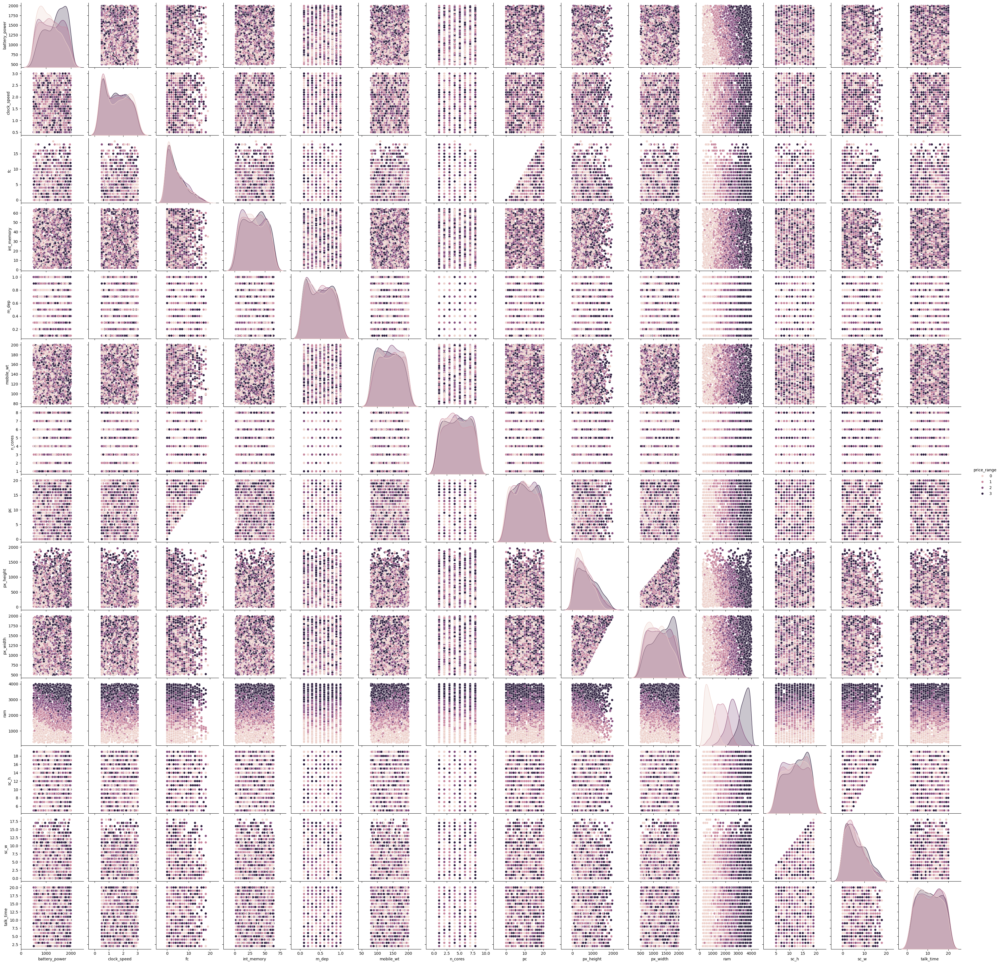

CPU times: total: 18.2 s
Wall time: 42.1 s


In [8]:
%%time
# pairplot for numeric cols
sns.pairplot(data=df[num_cols], hue='price_range')
plt.show()

The pairplot, as said before if overwhelming, the field with a clear scatter dependent on price range is `ram`. The distributions of `battery_power` show some dependency on the price range.

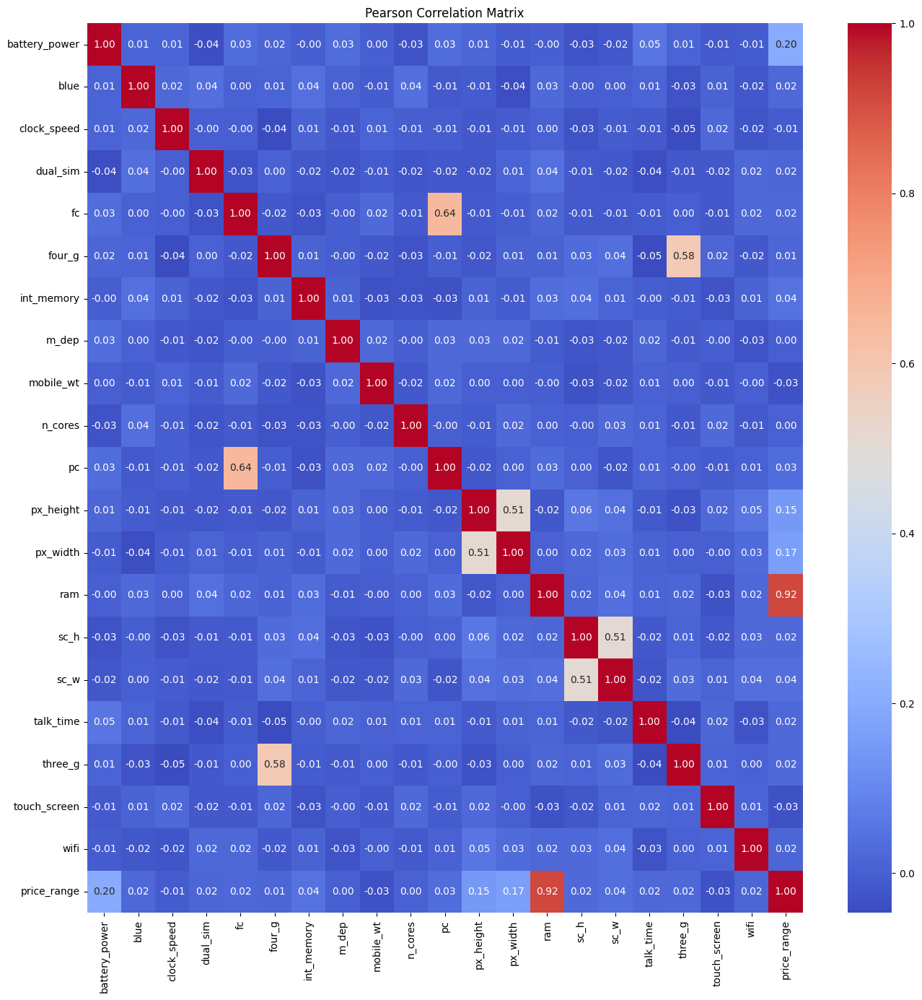

In [9]:
# correlation matrix, keeping the booleans
plt.figure(figsize=(16, 16))
sns.heatmap(df.corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Pearson Correlation Matrix')
plt.show()

In the correlation matrix we observe for `price_range`: a weak correlation of 0.20 with battery power, very weak correlation of 0.15 and 0.17 with `px_height` and `px_width` respectivelly, and a very strong correlation of 0.92 with `ram`(possibly collinearity).

There are other secondary correlations like `three_g` with `four_g`, etc. Which are not relevant for our `price_range` analysis.

In the correlation matrix, all the satistically relevant correlations are positive. It is, when A increases also does B.

### Target Variable Analysis

#### Price Range vs RAM

The field with most correlation to the `price range` is `ram`, so is the first detailed behaviour we'll study.

### Median ram by price range:
   price_range  ram_median
0            0       719.5
1            1      1686.5
2            2      2577.0
3            3      3509.5


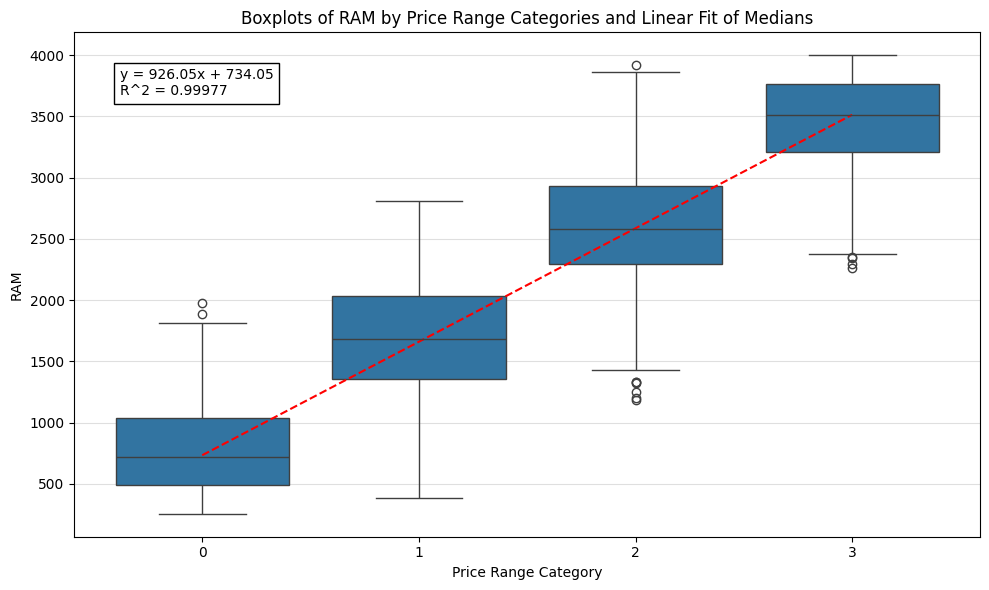

In [10]:
# ram median by price range category
ram_median = df.groupby('price_range')['ram'].median().reset_index()
ram_median.columns = ['price_range', 'ram_median']
print('### Median ram by price range:')
print(ram_median)

# prepare x and y
X = ram_median['price_range']
y = ram_median['ram_median']

# linear regression
slope, intercept, r_value, p_value, std_err = stats.linregress(X, y)
r_squared = r_value**2

# boxplot of ram distributions at different price ranges
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='price_range', y='ram')
sns.lineplot(x=X, y=slope*X + intercept, color='red', linestyle='--')

# legends & title
plt.xlabel('Price Range Category')
plt.ylabel('RAM')
plt.title('Boxplots of RAM by Price Range Categories and Linear Fit of Medians')
plt.annotate(
    f'y = {slope:.2f}x + {intercept:.2f}\nR^2 = {r_squared:.5f}',
    xy=(0.05, 0.875),
    xycoords='axes fraction',
    bbox=dict(facecolor='white', alpha=1, edgecolor='k')  # white background
    )
plt.grid(True, axis='y', alpha=0.4)
plt.tight_layout()
plt.show()

In the 'Boxplots of RAM by Price Range Categories and Linear Fit of Medians' we observe some outliers and a good liear fit for the medians. Defining the error as IQR/2, we can have a good `ram` prediction from the `price_range` variable.

Now we compare RAM distributions for different price range categories:


### RAM by price range kurtosis:
price_range
0   -0.326284
1   -0.416627
2   -0.011485
3   -0.035952
Name: ram, dtype: float64
### RAM by price range skewness:
price_range
0    0.617647
1   -0.100349
2   -0.071670
3   -0.756371
Name: ram, dtype: float64


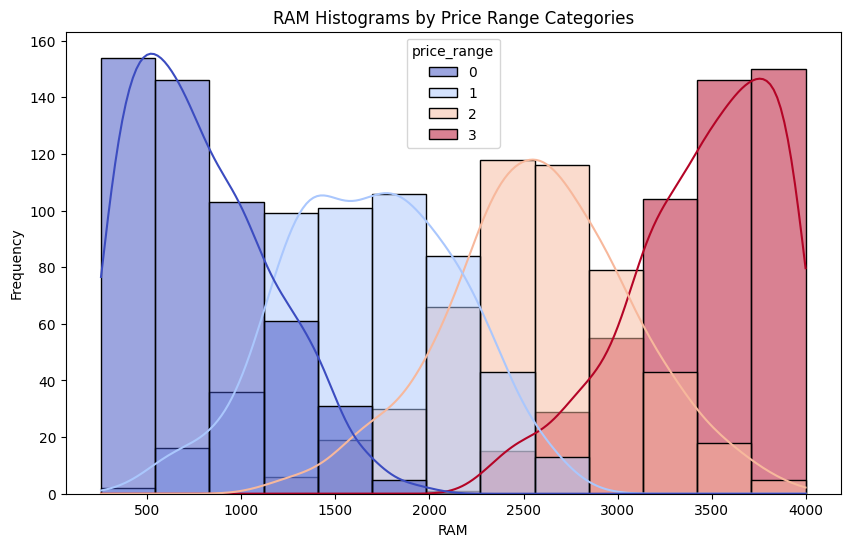

In [11]:
# ram distribution by price range category
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='ram', hue='price_range', kde=True, common_norm=False, palette='coolwarm')

# ram kurtosis and skewness by price range
kurtosis = df.groupby('price_range')['ram'].apply(stats.kurtosis)
skewness = df.groupby('price_range')['ram'].apply(stats.skew)
print('### RAM by price range kurtosis:')
print(kurtosis)
print('### RAM by price range skewness:')
print(skewness)

# add legend & title
plt.xlabel('RAM')
plt.ylabel('Frequency')
plt.title('RAM Histograms by Price Range Categories')
plt.show()

In the 'RAM Histograms by Price Range Categories' plot, we observe with more detail what was presented in the boxplots:

- RAM at Price Range 0 shows a positive skewness, indicating that the distribution of ram values is skewed to the right. This suggests that there are some higher ram values that are pulling the mean up, while most values are clustered at the lower end.
- RAM at Price Ranges 1 and 2 have near-zero skewness, suggesting that their distributions are approximately symmetric around the mean.
- RAM at Price Range 3 exhibits significant negative skewness, indicating a leftward skew where lower ram values are more prevalent, with some higher values pulling the mean down.

The kurtosis analysis indicates flatter distributions with fewer extreme values across all price ranges, while the skewness analysis reveals varying degrees of asymmetry.

**Normality Assumption**:

- The t-test assumes that the data are normally distributed. While moderate skewness (between -1 and 1) is acceptable, significant skewness can violate this assumption.

Given that Price Ranges 1 and 2 are approximately symmetric, they may be suitable for a t-test. However, the positive skew in Price Range 0 and negative skew in Price Range 3 could pose issues.


In [12]:
# t-stats on middle price range
tstat, p_val = stats.ttest_ind(df[df['price_range'] == 1]['ram'], df[df['price_range'] == 2]['ram'])
print(f'### Middle range stats: t-stat = {tstat}, p-value = {p_val}')

# t-stats high-low price range
tstat, p_val = stats.ttest_ind(df[df['price_range'] == 3]['ram'], df[df['price_range'] == 0]['ram'])
print(f'### High-low range stats: t-stat = {tstat}, p-value = {p_val}')

### Middle range stats: t-stat = -29.677364753627916, p-value = 2.9666077011414003e-139
### High-low range stats: t-stat = 111.37307717748769, p-value = 0.0


The t-test shows high-low range price distributions are different. Also shows the same for the mmiddle price range RAMs.

The RAMs distributions are not improved in the log space, although the square root transform behaves better:

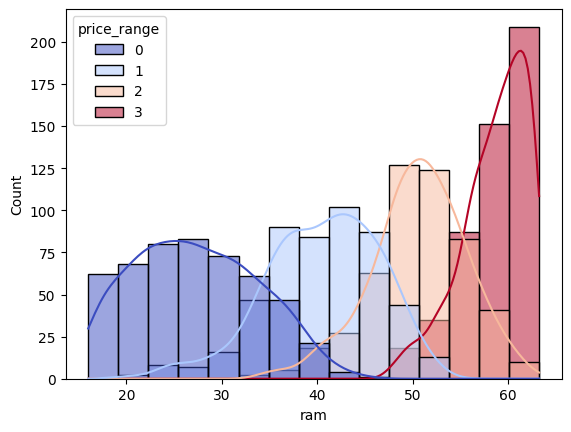

### RAM by price range kurtosis:
price_range
0   -0.801882
1    0.170628
2    0.274520
3    0.285230
Name: ram, dtype: float64
### RAM by price range skewness:
price_range
0    0.215287
1   -0.509734
2   -0.384613
3   -0.888787
Name: ram, dtype: float64


In [13]:
# apply square root transform
df_sqrt = pd.DataFrame()
df_sqrt['ram'] = np.sqrt(df['ram'])
df_sqrt['price_range'] = df['price_range']

# plot histogram
sns.histplot(data=df_sqrt, x='ram', hue='price_range', kde=True, common_norm=False, palette='coolwarm')
plt.show()

# sqrt_ram kurtosis and skewness by price range
kurtosis = df_sqrt.groupby('price_range')['ram'].apply(stats.kurtosis)
skewness = df_sqrt.groupby('price_range')['ram'].apply(stats.skew)
print('### RAM by price range kurtosis:')
print(kurtosis)
print('### RAM by price range skewness:')
print(skewness)

While the square root transformation may have some benefits, it does not seem to be sufficient for achieving normality in your data based on the current kurtosis and skewness values.

#### Price Range vs Battery Power


### Median battery power by price range:
   price_range  batt_median
0            0       1066.0
1            1       1206.0
2            2       1219.5
3            3       1449.5


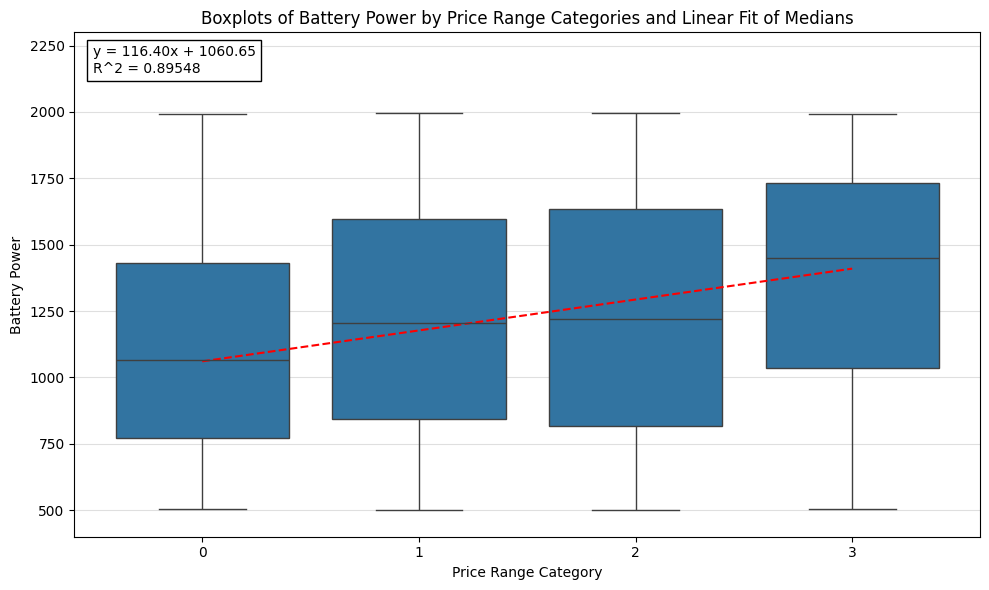

In [14]:
# battery power by price range
batt_median = df.groupby('price_range')['battery_power'].median().reset_index()
batt_median.columns = ['price_range', 'batt_median']
print('### Median battery power by price range:')
print(batt_median)

# prepare x and y
X = batt_median['price_range']
y = batt_median['batt_median']

# linear regression
slope, intercept, r_value, p_value, std_err = stats.linregress(X, y)
r_squared = r_value**2

# boxplot of battery power distributions at different price ranges
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='price_range', y='battery_power')
sns.lineplot(x=X, y=slope*X + intercept, color='red', linestyle='--')

# legend & title
plt.xlabel('Price Range Category')
plt.ylabel('Battery Power')
plt.title('Boxplots of Battery Power by Price Range Categories and Linear Fit of Medians')
plt.annotate(
    f'y = {slope:.2f}x + {intercept:.2f}\nR^2 = {r_squared:.5f}',
    xy=(0.02, 0.92),
    xycoords='axes fraction',
    bbox=dict(facecolor='white', alpha=1, edgecolor='k')  # white background
    )
plt.grid(True, axis='y', alpha=0.4)
plt.ylim(400, 2300)
plt.tight_layout()
plt.show()

In the 'Boxplots of Battery Power by Price Range Categories and Linear Fit of Medians' we observe no outliers and a not terrible linear fit that explains 89% of the spread for the medians. Defining the error as IQR/2, we can have a good battery power prediction from the price_range variable.

### Battery power by price range kurtosis:
price_range
0   -0.887939
1   -1.168619
2   -1.301195
3   -1.041008
Name: battery_power, dtype: float64
### Battery power by price range skewness:
price_range
0    0.396192
1    0.068435
2    0.030857
3   -0.363389
Name: battery_power, dtype: float64


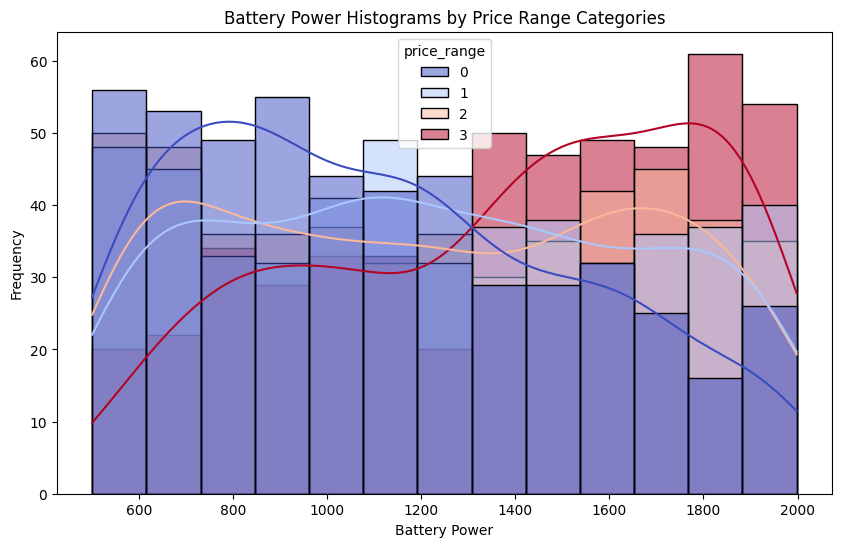

In [15]:
# battery distribution by price range category
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='battery_power', hue='price_range', kde=True, common_norm=False, palette='coolwarm')

# battery kurtosis and skewness by price range
kurtosis = df.groupby('price_range')['battery_power'].apply(stats.kurtosis)
skewness = df.groupby('price_range')['battery_power'].apply(stats.skew)
print('### Battery power by price range kurtosis:')
print(kurtosis)
print('### Battery power by price range skewness:')
print(skewness)

# add legend & title
plt.xlabel('Battery Power')
plt.ylabel('Frequency')
plt.title('Battery Power Histograms by Price Range Categories')
plt.show()


On the 'Battery Power Histograms by Price Range Categories' plot we have:
- Kurtosis: The negative kurtosis values for all price ranges indicate that none of the distributions conform to the normal distribution's characteristics, as they are all *platykurtic*.

- Skewness: While for `battery_power` in `price_ranges` categories 1 and 2 have skewness values close to zero (suggesting approximate symmetry), on categories 0 and 3 display skewness that deviates from normality.

Since we don't have normal distributions, a t-test is not a valid criteria.


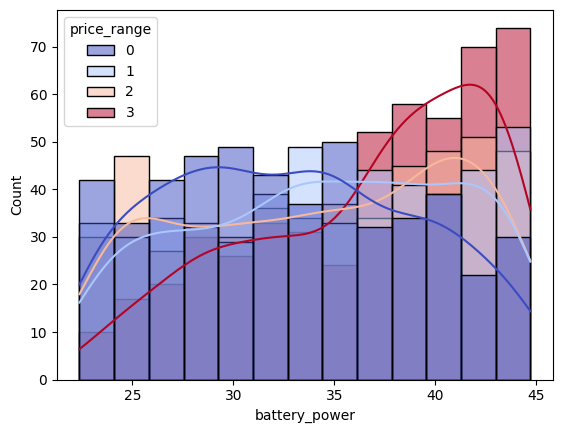

### Battery power by price range kurtosis:
price_range
0   -1.033522
1   -1.112675
2   -1.258203
3   -0.760097
Name: battery_power, dtype: float64
### Battery power by price range skewness:
price_range
0    0.134759
1   -0.172174
2   -0.177012
3   -0.585127
Name: battery_power, dtype: float64


In [16]:
# apply square root transform
df_sqrt = pd.DataFrame()
df_sqrt['battery_power'] = np.sqrt(df['battery_power'])
df_sqrt['price_range'] = df['price_range']

# plot histogram
sns.histplot(data=df_sqrt, x='battery_power', hue='price_range', kde=True, common_norm=False, palette='coolwarm')
plt.show()

# sqrt_batt kurtosis and skewness by price range
kurtosis = df_sqrt.groupby('price_range')['battery_power'].apply(stats.kurtosis)
skewness = df_sqrt.groupby('price_range')['battery_power'].apply(stats.skew)
print('### Battery power by price range kurtosis:')
print(kurtosis)
print('### Battery power by price range skewness:')
print(skewness)

After sqrt transform, the distributions of battery_power across all price ranges still cannot be considered normal due to their platykurtic nature and varying degrees of skewness. A t-test remains not a valid option.

#### Price Range vs Pixels Area

by multiplying the length and width in pixels of the screen we obtain the new variable `px_area`:


In [17]:
# define temporary df
df_pix = pd.DataFrame()
df_pix['px_area'] = df['px_height'] * df['px_width']
df_pix['price_range'] = df['price_range']

### Median pixel area by price range:
   price_range  pix_median
0            0    448852.0
1            1    661429.0
2            2    560907.0
3            3    860881.0


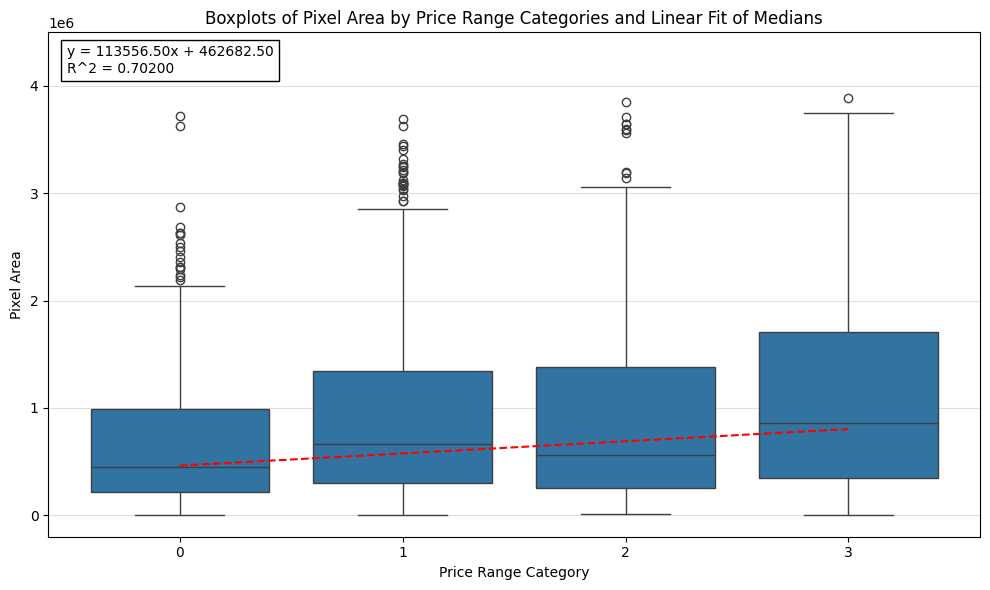

In [18]:
# pixel area by price range
pix_median = df_pix.groupby('price_range')['px_area'].median().reset_index()
pix_median.columns = ['price_range', 'pix_median']
print('### Median pixel area by price range:')
print(pix_median)

# prepare x and y
X = pix_median['price_range']
y = pix_median['pix_median']

# linear regression
slope, intercept, r_value, p_value, std_err = stats.linregress(X, y)
r_squared = r_value**2

# boxplot of pixel area distributions at different price ranges
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_pix, x='price_range', y='px_area')
sns.lineplot(x=X, y=slope*X + intercept, color='red', linestyle='--')

# legend & title
plt.xlabel('Price Range Category')
plt.ylabel('Pixel Area')
plt.title('Boxplots of Pixel Area by Price Range Categories and Linear Fit of Medians')
plt.annotate(
    f'y = {slope:.2f}x + {intercept:.2f}\nR^2 = {r_squared:.5f}',
    xy=(0.02, 0.92),
    xycoords='axes fraction',
    bbox=dict(facecolor='white', alpha=1, edgecolor='k')  # white background
    )
plt.ylim(-0.2e6, 4.5e6)
plt.grid(True, axis='y', alpha=0.4)
plt.tight_layout()
plt.show()

In the 'Boxplots of Pixel Area by Price Range Categories and Linear Fit of Medians' we observe many outliers over the upper whiskers and a not so great linear fit that explains only 70% of the points for the medians. Defining the error as IQR/2, the price range is not a good predictor for this variable.

### Pixel area by price range kurtosis:
price_range
0    2.177693
1    0.873134
2    0.911234
3   -0.234966
Name: px_area, dtype: float64
### Pixel area by price range skewness:
price_range
0    1.456291
1    1.233404
2    1.247553
3    0.844264
Name: px_area, dtype: float64


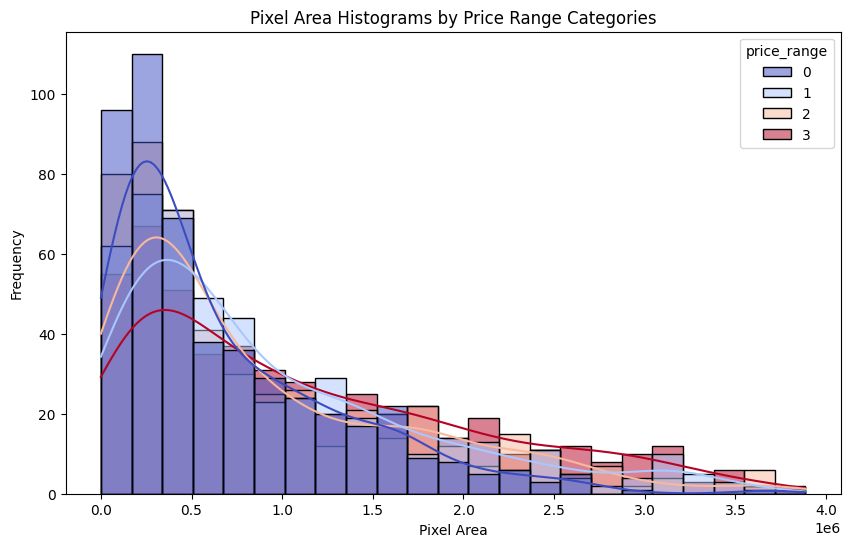

In [19]:
# pixel area distribution by price range category
plt.figure(figsize=(10, 6))
sns.histplot(data=df_pix, x='px_area', hue='price_range', kde=True, common_norm=False, palette='coolwarm')

# pixel area kurtosis and skewness by price range
kurtosis = df_pix.groupby('price_range')['px_area'].apply(stats.kurtosis)
skewness = df_pix.groupby('price_range')['px_area'].apply(stats.skew)
print('### Pixel area by price range kurtosis:')
print(kurtosis)
print('### Pixel area by price range skewness:')
print(skewness)

# add legend and title
plt.xlabel('Pixel Area')
plt.ylabel('Frequency')
plt.title('Pixel Area Histograms by Price Range Categories')
plt.show()

All price ranges exhibit positive skewness, indicating that the distributions have longer right tails. This means that higher pixel area values are more prevalent, pulling the mean to the right of the median.

Nne of the distributions can be considered normal due to their significant skewness and varying kurtosis. A t-test is not valid for this variable.

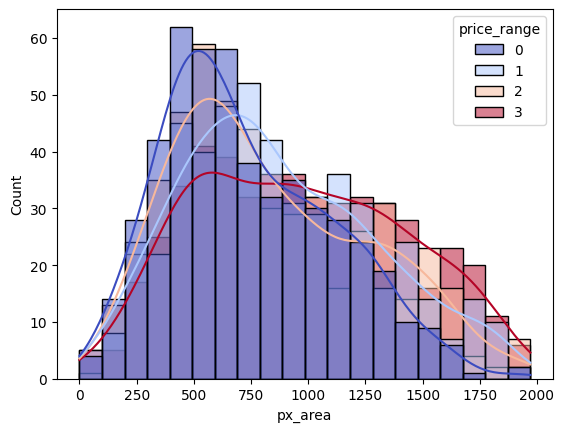

### Pixel area by price range kurtosis:
price_range
0   -0.347821
1   -0.524521
2   -0.628806
3   -0.923852
Name: px_area, dtype: float64
### Pixel area by price range skewness:
price_range
0    0.547842
1    0.411194
2    0.507348
3    0.170348
Name: px_area, dtype: float64


In [20]:
# apply square root transform
df_sqrt = pd.DataFrame()
df_sqrt['px_area'] = np.sqrt(df_pix['px_area'])
df_sqrt['price_range'] = df_pix['price_range']

# plot histogram
sns.histplot(data=df_sqrt, x='px_area', hue='price_range', kde=True, common_norm=False, palette='coolwarm')
plt.show()

# sqrt_area kurtosis and skewness by price range
kurtosis = df_sqrt.groupby('price_range')['px_area'].apply(stats.kurtosis)
skewness = df_sqrt.groupby('price_range')['px_area'].apply(stats.skew)
print('### Pixel area by price range kurtosis:')
print(kurtosis)
print('### Pixel area by price range skewness:')
print(skewness)

Overall, while the square root transformation has improved the characteristics of the `pixel_area` distributions by reducing skewness and kurtosis towards more normal-like behavior, none of the distributions can be considered perfectly normal yet. Again, a t-test is not a valid option.

---

## Conclusions

The studied dataset is composed of many different mobile phone features, we studied which of them presented correlation with the range of price `price_range` category.

In the scatter plot the only visible affected features are the RAM and the battery power, both showing clear diferent distributions for each different price category they were on.

The Pearson's correlation matrix shows a strong, potentially linear, correlation of 0.92 between the price range and the RAM. The battery power, pixel width and pixel height show all weak correlations. No other correlations are observed for the target variable.

Each of those three fields showing a correlation with the price range were studied individually:

- Price Range vs RAM:


    - The 'Boxplots of RAM by Price Range Categories and Linear Fit of Medians' plot shows a few outliers in close range to the whiskers. There is clear evidence of a linear relation between the price range and the RAM medians distribution.
    - The 'RAM Histograms by Price Range Categories' plot clearly differentiantes how the higher the price range, the bigger the RAM. This last is supported by the t-test


- Price Range vs Battery Power:


    - The 'Boxplots of Battery Power by Price Range Categories and Linear Fit of Medians' plot doesnt present outliers. The medians show a tendency to a better battery power for the higher price range categries.
    - The 'Battery Power Histograms by Price Range Categories' shows all distributions are spreaded (*platykurtic*). The kurtosis and skewness values don't allow a valid t-test.

- Price Range vs Pixel Area:

    - This variable was created based on the product of pixel width and ixel heigth, based on their correltion value.
    - The 'Boxplots of Pixel Area by Price Range Categories and Linear Fit of Medians' illustrates a baseline value for all categories and suggests a linear trend of increasing pixel area with higher price ranges. Generally, as the price category rises, the pixel area tends to increase; however, there is considerable variability, particularly within the lower price ranges.
    - The 'Pixel Area Histograms by Price Range Categories' shows a general tendency of a high concentration of lower pixel area with some spreading towards the bigger size. Although the spreading is bigger for the higer price range categories. None of the distributions are normal, therefore a t-test is not valid for this variable.

The square root transform couldn't improve any of the forementioned variables distributions closer to normal values.

---

## Future Steps

Although the dataset is rich in features, the correlations with the target variable are poor. New data aquisiton is suggested for a better mobile phone prices analysis.

Another non-parametric tests could shed more light into these non normal distributions.